In [1]:
import sys
syspath1 = [x for x in sys.path if 'besca_dev' in x ]
syspath2 = [x for x in sys.path if 'besca_dev' not  in x ]
sys.path = syspath1 + syspath2

# hands on tutorial


In this tutorial, we will go through the analysis of a single cell rnaseq dataset.

The analysis will be fragmented into more detailled than in the standard workflow, thus some of the steps are grouped in wrapper functions in **besca**


In [2]:
#import necessary python packages
import scanpy as sc #software suite of tools for single-cell analysis in python
import besca as bc #internal BEDA package for single cell analysis
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import scipy

sc.logging.print_versions() #output an overview of the software versions that are loaded

scanpy==1.5.1 anndata==0.7.3 umap==0.4.3 numpy==1.17.5 scipy==1.4.1 pandas==1.0.3 scikit-learn==0.23.1 statsmodels==0.11.1 python-igraph==0.8.2 leidenalg==0.8.1


In [3]:
from IPython.display import HTML
task = "<style>div.task { background-color: #ffc299; border-color: #ff944d; border-left: 7px solid #ff944d; padding: 1em;} </style>"
HTML(task)

In [4]:
tag = "<style>div.tag { background-color: #99ccff; border-color: #1a8cff; border-left: 7px solid #1a8cff; padding: 1em;} </style>"
HTML(tag)

In [5]:
FAIR = "<style>div.fair { background-color: #d2f7ec; border-color: #d2f7ec; border-left: 7px solid #2fbc94; padding: 1em;} </style>"
HTML(FAIR)

## Dataset Loading


In [6]:
#adata = sc.read(filepath)
adata = bc.datasets.Kotliarov2020_raw()

<div class="task">
    <p>1. How many cells does this dataset contain? </p>
    <p>2. How many genes does this dataset contain? </p>
    <p>3. Which categories of sample annotation are present? </p>
    <p>4. Do we have different batchs ? Are they equilibrated ? </p>
    <p>5. How many cells are from each Donor? Is it an equal distribution? </p>
</div>

In [7]:
## solution 1 and 2
adata

AnnData object with n_obs × n_vars = 58654 × 32738
    obs: 'CELL', 'CONDITION', 'sample_type', 'donor', 'tenx_lane', 'cohort', 'batch', 'sampleid', 'timepoint', 'percent_mito'
    var: 'ENSEMBL', 'SYMBOL', 'feature_type'

In [8]:
## solution 3
adata.obs.head(5)


,CELL,CONDITION,sample_type,donor,tenx_lane,cohort,batch,sampleid,timepoint,percent_mito
10X_CiteSeq_donor256.AAACCTGAGAGCCCAA-1,10X_CiteSeq_donor256.AAACCTGAGAGCCCAA-1,PBMC_healthy,PBMC,donor256,H1B1ln1,H1N1,1,256,d0,0.041481
10X_CiteSeq_donor273.AAACCTGAGGCGTACA-1,10X_CiteSeq_donor273.AAACCTGAGGCGTACA-1,PBMC_healthy,PBMC,donor273,H1B1ln1,H1N1,1,273,d0,0.049020
10X_CiteSeq_donor256.AAACCTGCAGGTGGAT-1,10X_CiteSeq_donor256.AAACCTGCAGGTGGAT-1,PBMC_healthy,PBMC,donor256,H1B1ln1,H1N1,1,256,d0,0.017332
10X_CiteSeq_donor200.AAACCTGCAGTATCTG-1,10X_CiteSeq_donor200.AAACCTGCAGTATCTG-1,PBMC_healthy,PBMC,donor200,H1B1ln1,H1N1,1,200,d0,0.017222
10X_CiteSeq_donor233.AAACCTGCATCACAAC-1,10X_CiteSeq_donor233.AAACCTGCATCACAAC-1,PBMC_healthy,PBMC,donor233,H1B1ln1,H1N1,1,233,d0,0.033969


In [38]:
adata.obs   = adata.obs.astype( {'batch_cat' =  categorical})

SyntaxError: invalid syntax (<ipython-input-38-243f95db8f7b>, line 1)

In [9]:
## solution 4
bc.tl.count_occurrence(adata,'batch')


,Counts
1,30668
2,27986


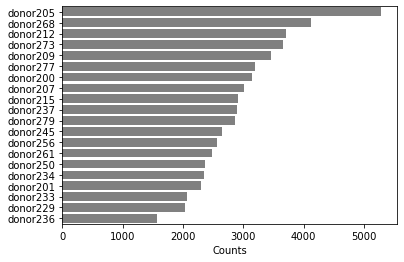

In [10]:
## solution 5

temp=bc.tl.count_occurrence(adata,'donor')

sns.barplot(y=temp.index,x=temp.Counts,color='gray',orient='h')
#temp

## Quality Control

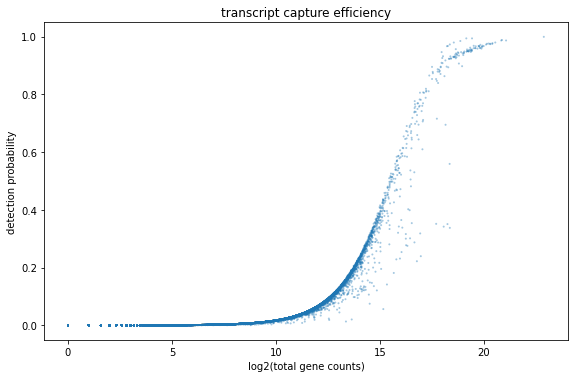

In [11]:
fig, ax = plt.subplots(1)
fig.set_figwidth(8)
fig.set_figheight(5)
fig.tight_layout()

bc.pl.transcript_capture_efficiency(adata,ax=ax)

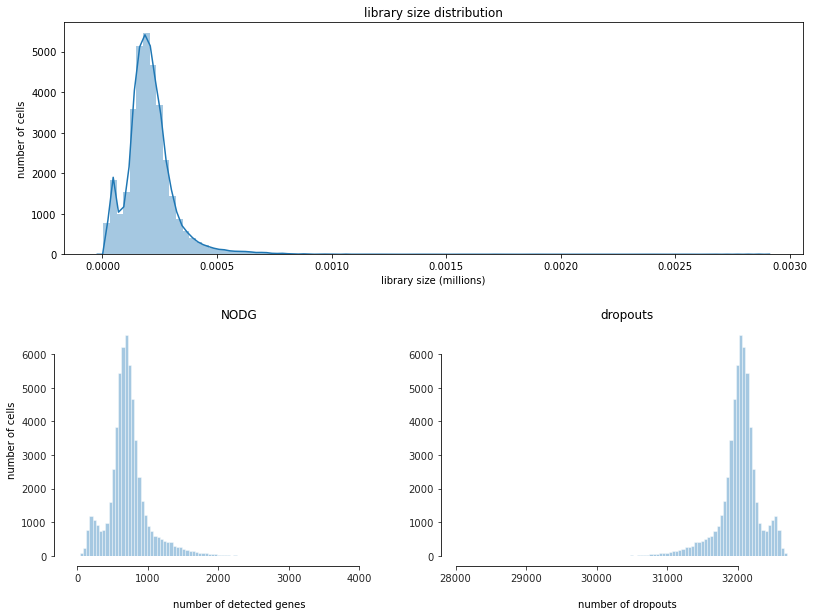

In [12]:
fig = bc.pl.librarysize_overview(adata, bins=100)

## Preprocessing

<div class="task">
    <p> 6. what do you think are reasonable cutoffs for this dataset? Why do we filter for these particular cutoffs? </p>
</div>

In [13]:
## solution 6

min_genes = 500
min_counts= 1000
min_cells = 30
max_genes = 3000
max_counts = 20000
max_mito = 0.05



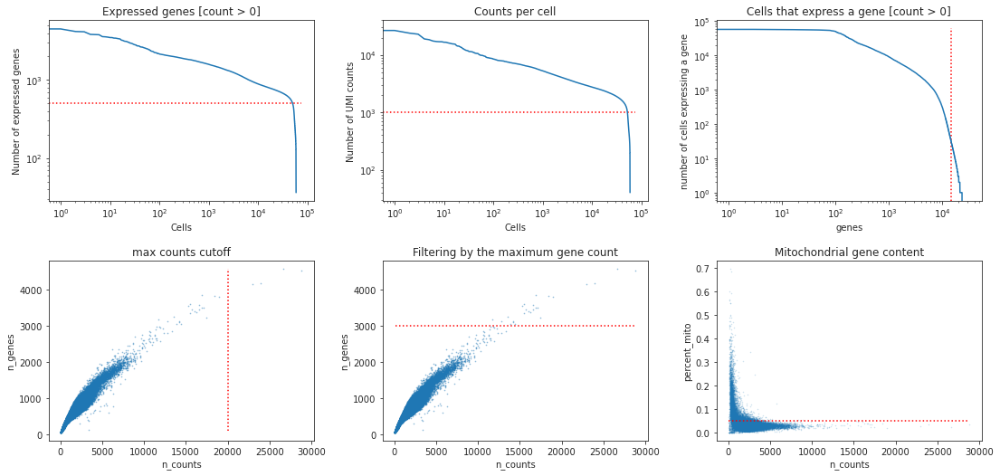

In [14]:
fig, ((ax1, ax2, ax3), (ax4, ax5, ax6))= plt.subplots(ncols=3, nrows=2)
fig.set_figwidth(16)
fig.set_figheight(8)
fig.tight_layout(pad=4.5)

bc.pl.kp_genes(adata, min_genes=min_genes, ax = ax1)
bc.pl.kp_counts(adata, min_counts = min_counts, ax = ax2)
bc.pl.kp_cells(adata, min_cells=min_cells, ax = ax3)

bc.pl.max_counts(adata, max_counts=max_counts, ax = ax4)
bc.pl.max_genes(adata, max_genes = max_genes, ax = ax5)
bc.pl.max_mito(adata, max_mito=max_mito, annotation_type='SYMBOL', species='human', ax = ax6)

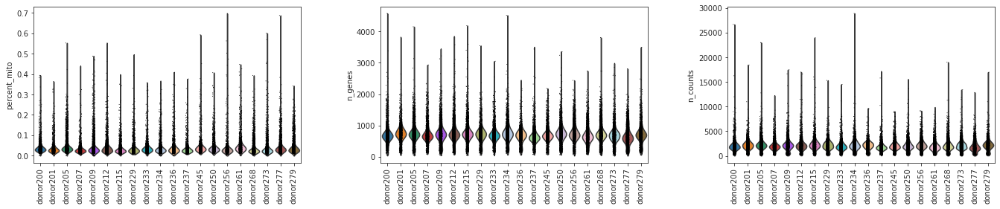

In [15]:
sc.pl.violin(adata, ['percent_mito','n_genes', 'n_counts'], groupby='donor',jitter=0.1,rotation=90)

In [16]:
adata = bc.pp.filter(adata, max_counts=max_counts, max_genes = max_genes, max_mito = max_mito, min_genes = min_genes, min_cells = min_cells, min_counts = min_counts)

started with  58654  total cells and  32738  total genes
removed 25 cells that expressed more than 3000 genes
removed 8715 cells that did not express at least 500  genes
removed 0 cells that had more than 20000  counts
removed 143 cells that did not have at least 1000 counts
removed 17856 genes that were not expressed in at least 30 cells
removed  2260  cells that expressed  5.0 percent mitochondrial genes or more
finished with 47511  total cells and 14882 total genes


<div class="task">
    <p> 7. Were there differences in viability between Donors? </p>
</div>

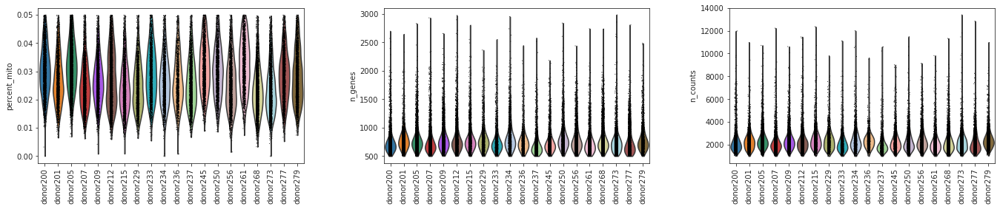

In [17]:
## Solution 7

sc.pl.violin(adata, ['percent_mito','n_genes', 'n_counts'], groupby='donor',jitter=0.1,rotation=90)

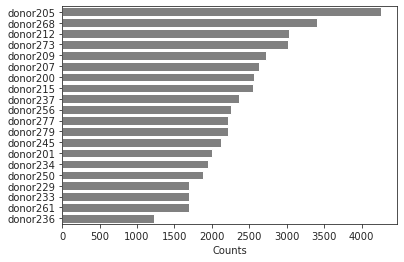

In [18]:


adata.obs.donor.value_counts()
temp=bc.tl.count_occurrence(adata,'donor')

sns.barplot(y=temp.index,x=temp.Counts,color='gray',orient='h')
#temp

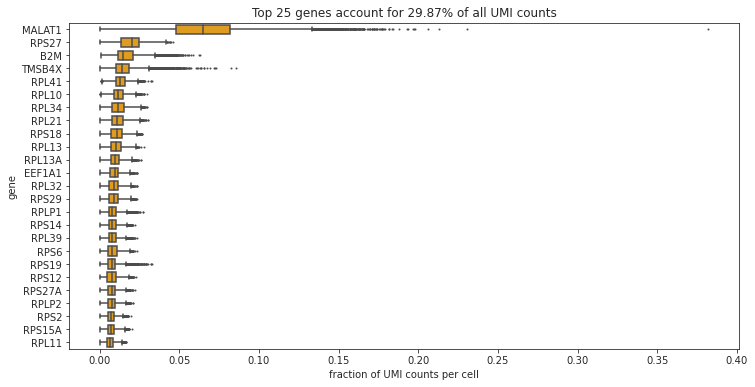

In [19]:
bc.pl.top_genes_counts(adata=adata, top_n=25, ax=None)

<div class="task">
    <p> 8. Which are the most commonly expressed genes? Is this what you would expect? </p>
</div>

## Normalization


In [20]:
#normalize per cell
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)

#save a copy (logarithmized for better understanding of values) to adata.raw
adata.raw = sc.pp.log1p(adata, copy= True)

<div class="fair">
    <p> write out cp10k values for loading into database</p>
    <p> `bc.st.export_cp10k(adata=adata, basepath='FILEPATH_TO_FOLDER_CONTAINING_RAW_SUBFOLDER')` </p>
</div>

<div class="task">
    <p> 9. What does a cp10k of 10 mean? Why do we normalize to cp10k? </p>
</div>

## variance in the dataset

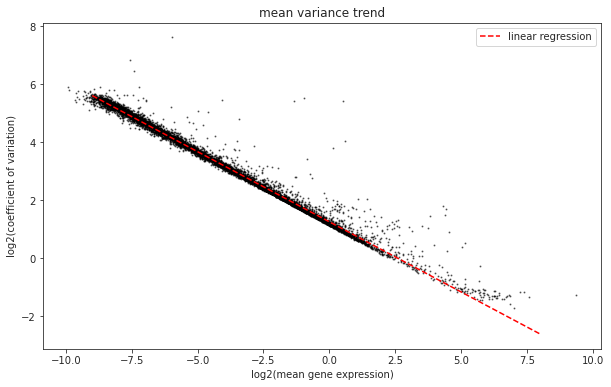

In [21]:
# calculate mean and coefficient of variation for each gene and add to adata.var
adata.var['mean'] = adata.X.todense().mean(axis = 0).tolist()[0]
adata.var['mean_log1p'] = np.log2(adata.var.get('mean').values)
adata.var['coeffvar'] = scipy.stats.variation(adata.X.todense(), axis = 0)
adata.var['coeffvar_log1p'] = np.log2(adata.var.get('coeffvar').values)

#generate a plot of our data to visualize
x = adata.var.mean_log1p.to_frame()
y = adata.var.coeffvar_log1p.to_frame()

#calculate linear fit between mean and cv
from sklearn import linear_model

#generate linear model
lm = linear_model.LinearRegression()
model = lm.fit(x,y)

#make predictions
X = range(int(min(x['mean_log1p'])), int(max(x['mean_log1p'])))
predictions = lm.predict(pd.DataFrame(data = list(X)))

#generate plot
fig = plt.figure(figsize=(10,6))
ax = fig.add_subplot(1, 1, 1)
ax.scatter(x = x, y = y, alpha = 0.5, s=1, color = 'black')
ax.set_xlabel('log2(mean gene expression)')
ax.set_ylabel('log2(coefficient of variation)')
ax.set_title('mean variance trend')
ax.plot(X, predictions, color = 'red', linestyle = 'dashed', label="linear regression")
ax.legend()

<div class="task">
    <p> 10. What trend can we see in the dataset? Why does it make sense that we observe this trend? Which genes are the ones that interest us? </p>
</div>

## selection highly variable genes

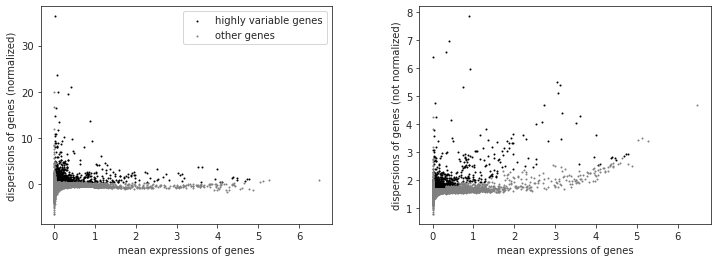

number of variable genes selected  1567


In [22]:
variable_genes_min_mean = 0.01
variable_genes_max_mean = 5
variable_genes_min_disp = 0.4

#identify genes with variable expression
filter_result = sc.pp.filter_genes_dispersion(adata.X, min_mean=variable_genes_min_mean, max_mean=variable_genes_max_mean, min_disp=variable_genes_min_disp) 
sc.pl.filter_genes_dispersion(filter_result)
nbr_variable_genes = sum(filter_result.gene_subset)
print('number of variable genes selected ', nbr_variable_genes )

In [23]:
#perform the actual filtering
adata = adata[:, filter_result.gene_subset]

<div class="task">
    <p> 11. Why do we reduce the number of genes that we look at? What do the genes we select have in common? </p>
</div>

In [24]:
#log transform our data (is easier to work with numbers like this)
sc.pp.log1p(adata)

## unwanted sources of variance

In [25]:
#define several input factors
random_seed = 0 #define a random seed so that for stochastic processes you get reproducible results
max_value = 10

<div class="task">
    <p> 12. What is a potential issue when removing unwanted sources of variance? </p>
</div>

In [26]:
#remove variance due to difference in counts and percent mitochondrial gene content
adata = sc.pp.regress_out(adata, ['n_counts', 'percent_mito'], copy=True)

In [27]:
sc.pp.scale(adata, max_value=10) # Scale data to unit variance and zero mean, and cut-off at max value 10

<div class="fair">
    <p> write out regressedOut values for loading into database</p>
    <p> `bc.st.export_regressedOut(adata = adata, basepath='FILEPATH_TO_FOLDER_CONTAINING_RAW_SUBFOLDER')` </p>
</div>

<div class="task">
    <p> 13. Besides regressOut what else might we consider correcting for? Why is it possible in this dataset? </p>
</div>

## Principle component analysis

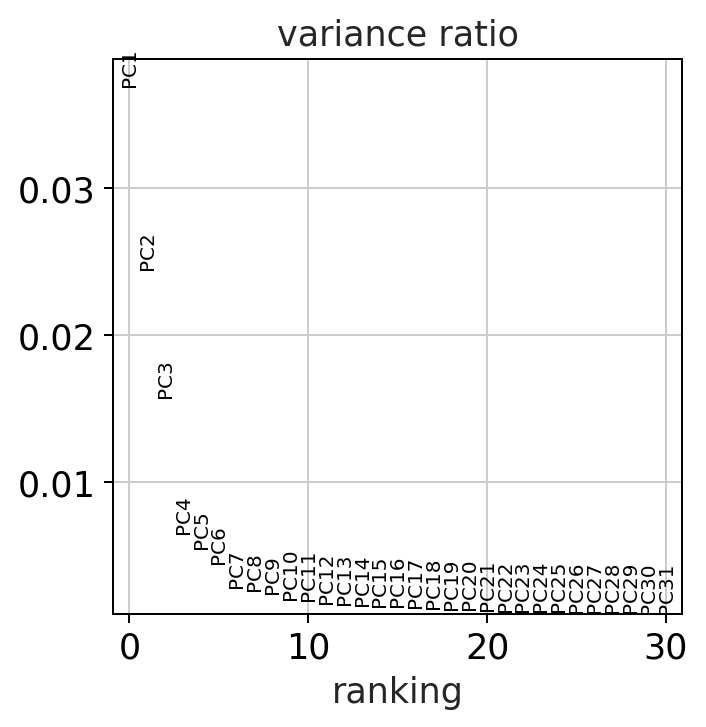

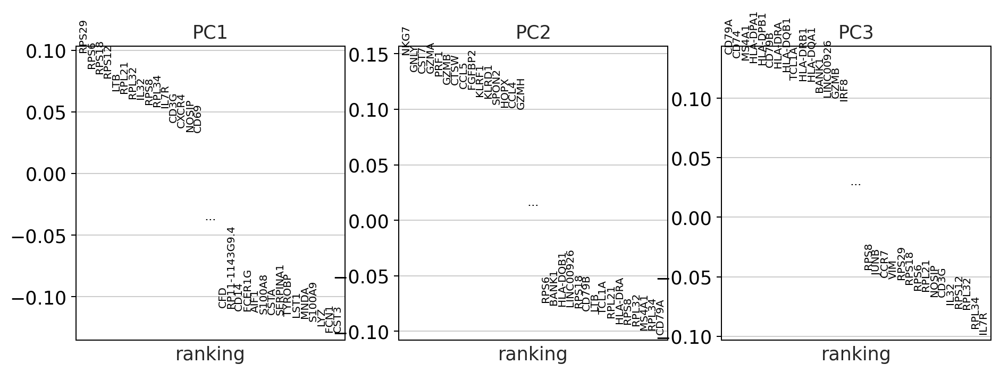

In [28]:
sc.settings.set_figure_params(dpi=90)

#calculate 50 principle components of the dataset
sc.tl.pca(adata, random_state = random_seed, svd_solver = 'arpack')

#visualize the amount of variance explained by each PC
sc.pl.pca_variance_ratio(adata)

#visualize the loadings onto the first 3 PCs
sc.pl.pca_loadings(adata)

<div class="task">
    <p> 14. Do we observe differences in the amount of variance that the PCs explain in the corrected vs the uncorrected data?  why might this be? </p>
</div>

### batch correction

Batch correction is perfomed here using the bbknn graph based method.


In [29]:
adata_uncorrected = adata.copy()

<div class="tag">
    <p> We will continue doing each step both for the corrected and the uncorrected dataset so that we can compare our results. </p>
</div>

## nearest neighbor calculation

Computes a neighborhood graph of the cells based on the first 50 principle components.

In [30]:
%%time
sc.pp.neighbors(adata_uncorrected, n_neighbors=15, random_state = random_seed, n_pcs=50)

CPU times: user 21.4 s, sys: 3.74 s, total: 25.1 s
Wall time: 27 s


The second batch correction method we will look at for comparision purposes is called bbknn. This method introduces the batch correction during the calculation of the nearest neighbors. It splits your dataset into a smaller number of batches and ensures that each cell is connected to atleast a small number of other cells from each batch. This will bring the more closely related cells from each batch closer together. A huge benefit is that it works extremely quickly.

In [31]:
%%time
#perform batch correction using bbknn (graph based batch correction method)
import bbknn
bbknn.bbknn(adata, batch_key='batch') #perform alternative batch correction method

CPU times: user 4.08 s, sys: 16.9 ms, total: 4.1 s
Wall time: 4.1 s


## Leiden clustering

In [32]:
sc.tl.leiden(adata_uncorrected, random_state = random_seed)
#sc.tl.louvain(adata_mnn, random_state=random_seed) # Please uncommentn if you calculated adata_mnn (see above)
sc.tl.leiden(adata, random_state = random_seed)

## UMAP

In [33]:
%%time

##Warning this code block will take 1-2mins to execute
sc.tl.umap(adata_uncorrected, random_state = random_seed)
sc.tl.umap(adata, random_state = random_seed)

CPU times: user 1min 43s, sys: 1.81 s, total: 1min 45s
Wall time: 1min 40s


<div class="tag">
    <p> Due to the larger dataset calculating the t-SNE plot would already take several minutes wich is why we left it out </p>
</div>

## Visualize our Results

uncorrected


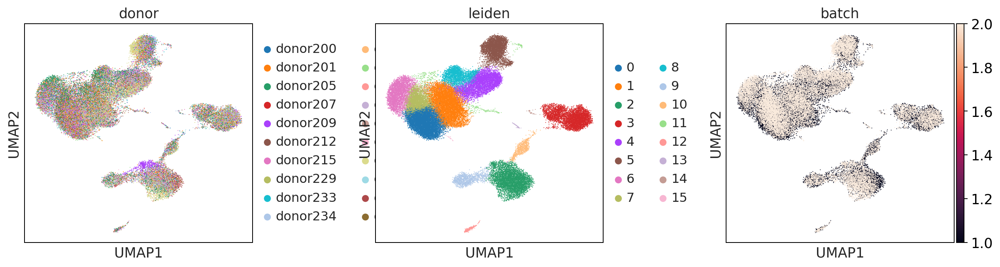

mnnpy
bbknn


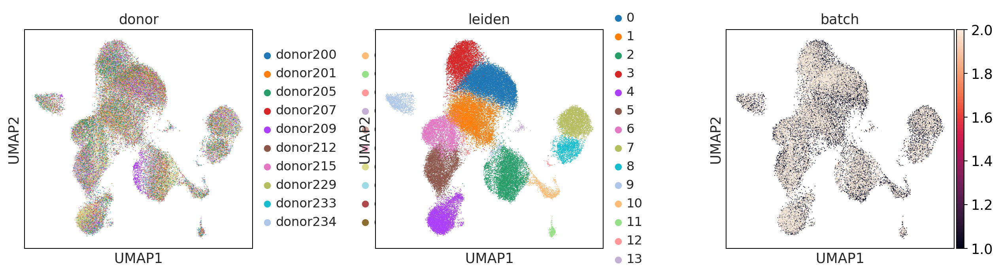

In [34]:
sc.settings.set_figure_params(dpi=90)
print('uncorrected')
sc.pl.umap(adata_uncorrected, color = ['donor', 'leiden', 'batch'], wspace = 0.4)


print('bbknn')
sc.pl.umap(adata, color = ['donor', 'leiden', 'batch'], wspace = 0.4)

<div class="task">
    <p> 15. What do you think about the batch correction method? Are there  large differences? </p>
</div>

## Observe cell type/markers

This will aid us in labeling the celltypes found in the complete dataset.

<div class="tag">
    <p> After this point we will only proceed with the batch corrected dataset.</p>
</div>

In [35]:
#define genesets for cell type identification
b_cells = ['CD19', 'CD79A', 'MS4A1']
t_cells = ['CD3E', 'CD3G', 'CD3D']
t_cell_subsets = ['CD4', 'CD8A', 'CD8B']
naive_t_cell = ['SELL', 'CCR7', 'IL7R']
myeloid_cells = ['S100A8', 'S100A9', 'CST3']
monocytes = ['FCGR3A', 'CD14'] #FCGR3A/B = CD16
dendritic_cells = ['FCER1A', 'ITGAM', 'ITGAX'] #ITGAM = CD11b #ITGAX= CD11c 
NK_cells = ['NCAM1', 'NKG7', 'CD3G']

b_cells


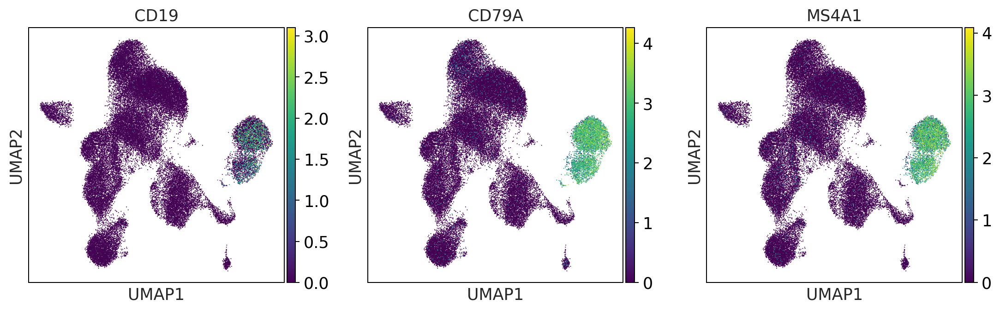

t_cells


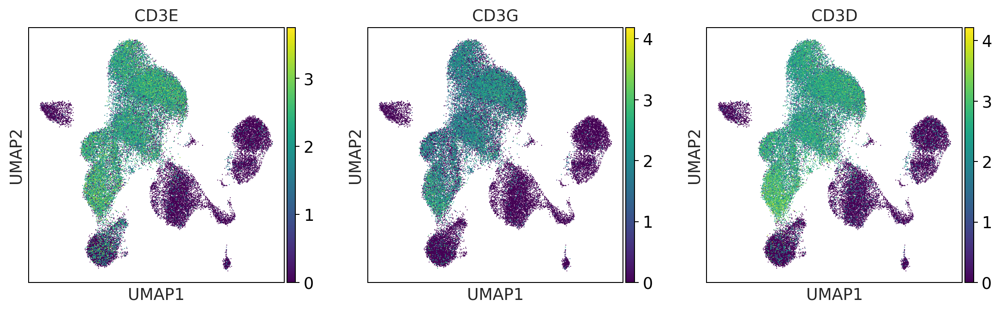

t_cell_subsets


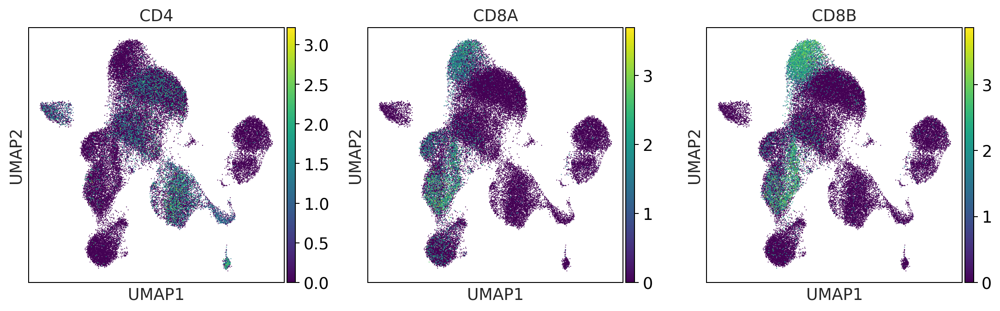

NK_cells


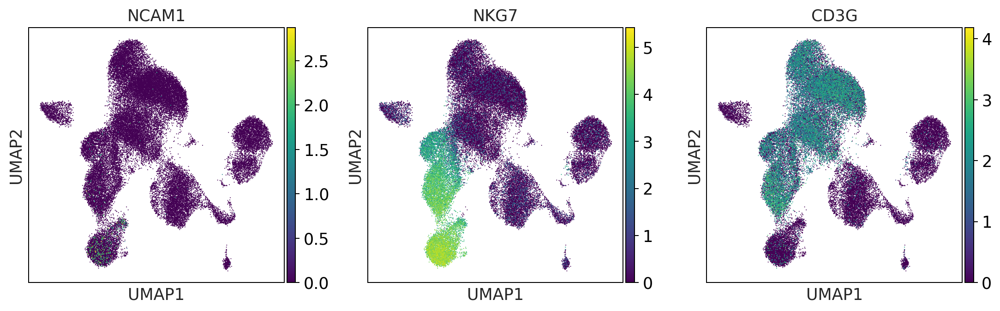

myeloid_cells


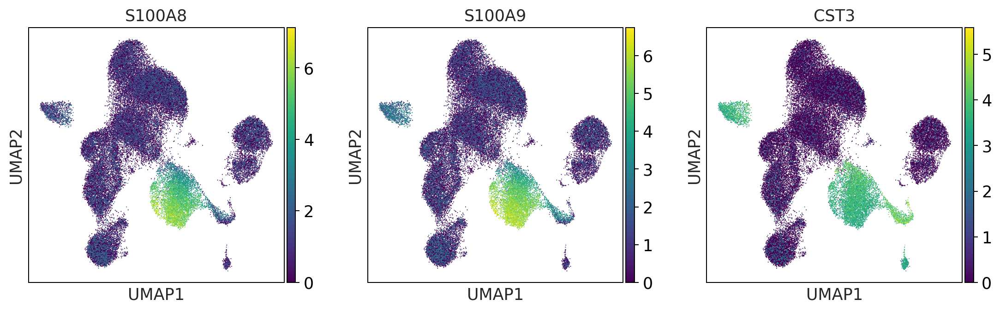

monocytes


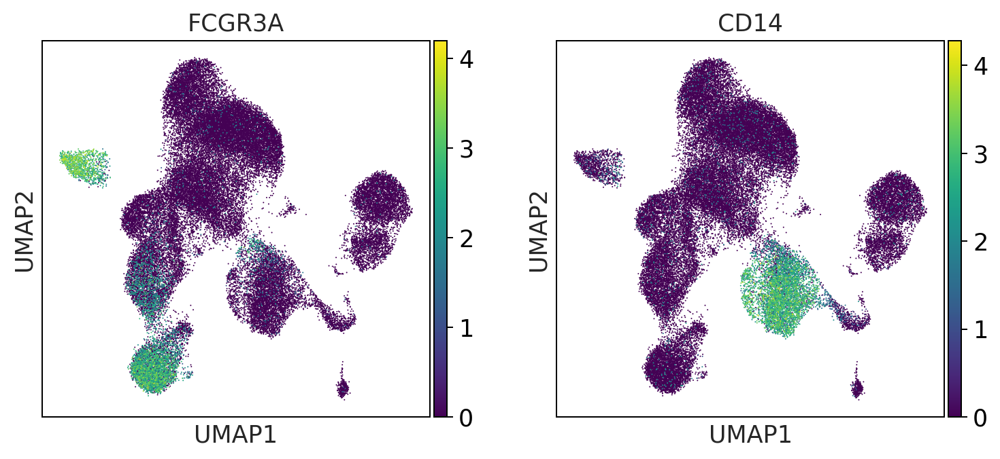

dendritic_cells


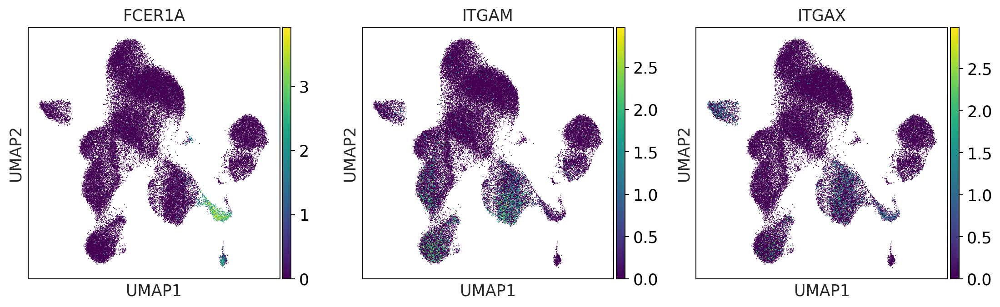

In [36]:
sc.settings.set_figure_params(dpi=90)
#visualize the gene expression as an overlay of the umap
#(this way you can visually identify the clusters with a high expression))
print('b_cells')
sc.pl.umap(adata, color = b_cells, color_map = 'viridis', ncols = 3)
print('t_cells')
sc.pl.umap(adata, color = t_cells, color_map = 'viridis', ncols = 3)
print('t_cell_subsets')
sc.pl.umap(adata, color = t_cell_subsets, color_map = 'viridis', ncols = 3)
print('NK_cells')
sc.pl.umap(adata, color = NK_cells,  color_map = 'viridis',ncols = 3)
print('myeloid_cells')
sc.pl.umap(adata, color = myeloid_cells,  color_map = 'viridis',ncols = 3)
print('monocytes')
sc.pl.umap(adata, color = monocytes, color_map = 'viridis', ncols = 3)
print('dendritic_cells')
sc.pl.umap(adata, color = dendritic_cells, color_map = 'viridis', ncols = 3)

In [37]:
print('t_cell_subsets')
sc.pl.dotplot(adata, groupby='louvain', var_names = t_cells + t_cell_subsets)

t_cell_subsets


ValueError: groupby has to be a valid observation. Given louvain, valid observations: ['CELL', 'CONDITION', 'sample_type', 'donor', 'tenx_lane', 'cohort', 'batch', 'sampleid', 'timepoint', 'percent_mito', 'n_counts', 'n_genes', 'leiden']

In [ ]:
sc.pl.umap(adata, color = ['leiden'], palette = 'tab20')

<div class="task">
    <p> One could annotate the cell types using the observed markers. 
    Using Besca, We advise to use the auto-annot modules if you have a reference dataset, or Signature-based annotation.</p>
</div>

In [ ]:
# The annotated and batch corrected datasets can be loaded using:  ( will download the dataset from Zenodo. Could take some time initially)

adata_annotation = bc.datasets.Kotliarov2020_processed()
adata_annotation 

## Quantify celltypes per donor

In [ ]:
sc.pl.umap(adata_annotation, color = ['donor', 'celltype0', 'celltype1', 'celltype2', 'celltype3'], ncols = 1)

In [ ]:
fig = bc.pl.celllabel_quant_stackedbar(adata_annotation, count_variable='donor', subset_variable = 'celltype1')

## Little excursion into differential gene expression analysis


In this dataset, there are not exactly specific conditions to observe. However we could try to see whether there are large variability between donors. 
This is just for illustration purposes.

In [ ]:
sc.tl.rank_genes_groups(adata_annotation, use_raw = True, groupby = 'donor')

In [ ]:
sc.pl.rank_genes_groups_dotplot(adata_annotation, n_genes=5, groupby = 'donor')

In [ ]:
sc.pl.rank_genes_groups_matrixplot(adata_annotation, n_genes=5, use_raw=True, groupby = 'donor')

In [ ]:
sc.pl.rank_genes_groups_stacked_violin(adata_annotation, n_genes=2, groupby='donor')